In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import os
import sys

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec

In [3]:
from matplotlib.pyplot import rc_context

In [6]:
import scipy.stats as stats
import scipy

In [7]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [8]:
from scAAnet.tools import load_df_from_npz, save_df_to_npz, plotRankedGeneScore, plotDensity, plotDensityGamma, geneScore


In [9]:
import scipy.sparse as sp

In [10]:
from sklearn.metrics import adjusted_mutual_info_score, adjusted_rand_score, silhouette_score

# Load Baron data

In [3]:
data = pd.read_csv("/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/GSM2230757_human1_umifm_counts.csv.gz", index_col=0)

In [66]:
data.shape

(1937, 20127)

In [7]:
data.head()

,barcode,assigned_cluster,A1BG,A1CF,A2M,A2ML1,A4GALT,A4GNT,AA06,AAAS,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3,pk
human1_lib1.final_cell_0001,GATGACGGAC-GGTGGGAT,acinar,0,4,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,1
human1_lib1.final_cell_0002,GAGCGTTGCT-ACCTTCTT,acinar,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,4,0,1,0
human1_lib1.final_cell_0003,CTTACGGG-CCATTACT,acinar,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
human1_lib1.final_cell_0004,GATGTACACG-TTAAACTG,acinar,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,3,1,0,0
human1_lib1.final_cell_0005,GAGATTGCGA-GTCGTCGT,acinar,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1


In [5]:
rna = data.iloc[:,2:]
obs = data.iloc[:,:2]

In [6]:
adata = sc.AnnData(rna, obs=obs)

In [11]:
adata

AnnData object with n_obs × n_vars = 1908 × 2002
    obs: 'barcode', 'assigned_cluster', 'n_counts', 'n_genes'
    var: 'n_cells'
    uns: 'assigned_cluster_colors'
    obsm: 'X_umap'

In [9]:
adata.X = sp.csr_matrix(adata.X)

In [71]:
adata.X

<1937x20125 sparse matrix of type '<class 'numpy.float32'>'
	with 3726445 stored elements in Compressed Sparse Row format>

# Preprocessing

In [72]:
# Filter out genes with non-zero expression in less than 3 cells
sc.pp.filter_genes(adata, min_cells=3)

In [74]:
# Filter out genes with mean expression less than 0.001
np.sum(adata.X.mean(0)< 0.001)

0

In [75]:
# Filter out ERCC genes
ercc_genes = adata.var_names.str.startswith("ERCC")
adata = adata[:,np.invert(ercc_genes)]

In [43]:
adata.obs.assigned_cluster.value_counts()

beta                  872
alpha                 236
delta                 214
endothelial           130
ductal                120
acinar                110
quiescent_stellate     92
gamma                  70
activated_stellate     51
macrophage             14
epsilon                13
mast                    8
schwann                 5
t_cell                  2
Name: assigned_cluster, dtype: int64

In [76]:
# Filter out non-relevant cell types
drop_ct = ["t_cell", "schwann", "mast", "macrophage"]
retain = np.invert([label in drop_ct for label in adata.obs.assigned_cluster])
adata = adata[retain,:]

In [75]:
adata.obs.assigned_cluster.value_counts()

beta                  872
alpha                 236
delta                 214
endothelial           130
ductal                120
acinar                110
quiescent_stellate     92
gamma                  70
activated_stellate     51
epsilon                13
Name: assigned_cluster, dtype: int64

In [78]:
# Calculate total number of counts and total number of genes
adata.obs["n_counts"] = adata.X.sum(axis=1).A1
adata.obs["n_genes"] = (adata.X>0).sum(axis=1).A1

Trying to set attribute `.obs` of view, copying.


... storing 'barcode' as categorical
... storing 'assigned_cluster' as categorical


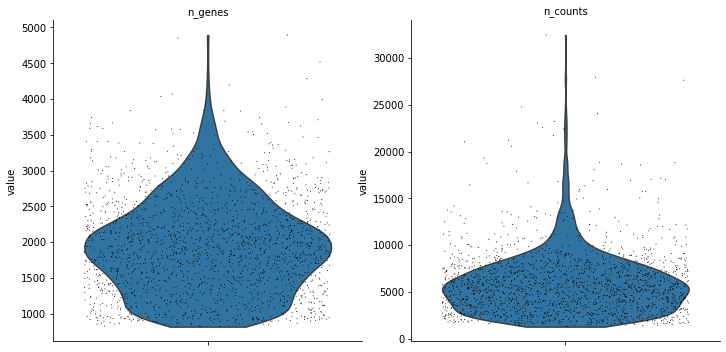

In [79]:
sc.pl.violin(adata, ['n_genes', 'n_counts'], jitter=0.4, multi_panel=True)

# Processing

In [82]:
adata_original = adata.copy()

In [164]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000)

... storing 'barcode' as categorical
... storing 'assigned_cluster' as categorical


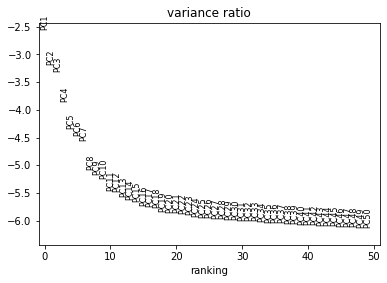

In [165]:
adata.raw = adata
sc.pp.regress_out(adata, ['n_counts'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [166]:
sc.pp.neighbors(adata, n_pcs=35, n_neighbors=15)
sc.tl.umap(adata)

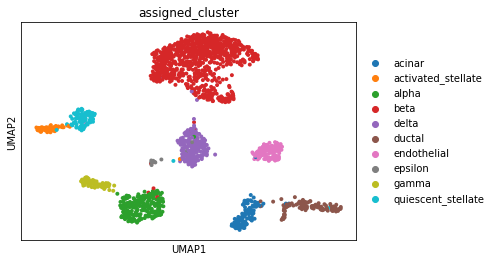

In [84]:
sc.pl.umap(adata, color=['assigned_cluster'])

In [50]:
# ASW
print(silhouette_score(adata.obsm['X_umap'], adata.obs['assigned_cluster']))
print(silhouette_score(adata.obsm['X_scaanet'], adata.obs['assigned_cluster']))

0.6037648
0.5517283


In [85]:
# Append X_umap to adata_original
adata_original.obsm['X_umap'] = adata.obsm['X_umap']

In [87]:
# Save to h5ad file
adata_original.write('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron_all.h5ad')

In [134]:
# Get a subset based on hvgs
hvg = adata.var.index[adata.var["highly_variable"]].tolist()
gene_list = ["GCG","PPY"] + hvg
adata_original = adata_original[:,gene_list]

In [135]:
adata_original

AnnData object with n_obs × n_vars = 1908 × 2002
    obs: 'barcode', 'assigned_cluster', 'n_counts', 'n_genes'
    var: 'n_cells'
    obsm: 'X_umap'

In [137]:
# Save to h5ad file
adata_original.write('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron.h5ad')

# Run NMF

In [21]:
adata = sc.read_h5ad('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron.h5ad')
X_umap = adata.obsm['X_umap']

In [112]:
adata

AnnData object with n_obs × n_vars = 1908 × 2002
    obs: 'barcode', 'assigned_cluster', 'n_counts', 'n_genes', 'GEP 1', 'GEP 2', 'GEP 3', 'GEP 4', 'GEP 5', 'GEP 6', 'GEP 7', 'GEP 8', 'GEP 9', 'GEP 10'
    var: 'n_cells'
    uns: 'assigned_cluster_colors', 'nmf', 'umap'
    obsm: 'X_umap', 'X_nmf', 'X_scaanet'
    obsp: 'nmf_distances', 'nmf_connectivities'

In [63]:
count = pd.DataFrame(adata.X.todense(), index=adata.obs.index, columns=adata.var.index)
print(count.shape[0])
tpm = count.div(count.sum(axis=1), axis=0)

1908


In [66]:
from sklearn.decomposition import non_negative_factorization

In [68]:
K = 10
seed=1
nmf_kwargs = dict(
    alpha=0.0,
    l1_ratio=0.0,
    beta_loss='frobenius',
    solver='cd',
    tol=1e-4,
    max_iter=400,
    regularization=None,
    init='random',
    random_state=seed,
    n_components=K)
(W, H, niter) = non_negative_factorization(tpm, **nmf_kwargs)
recon = np.matmul(W, H)

/gpfs/ysm/home/yw599/venv/lib64/python3.6/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 400 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


In [76]:
usage = pd.DataFrame(W, index=count.index, columns = np.arange(1,K+1))
usage = usage.div(usage.sum(axis=1), axis=0)
spectra = pd.DataFrame(np.transpose(H), index=count.columns, columns=np.arange(1,K+1))
recon = pd.DataFrame(recon, index=count.index, columns=count.columns)

In [23]:
dist = 'nmf'

In [77]:
save_df_to_npz(spectra, '/home/yw599/project/baron_data/baron.program.%s.rs%d.k%s.df.npz'%(dist, seed, K))
save_df_to_npz(usage, '/home/yw599/project/baron_data/baron.usage.%s.rs%d.k%s.df.npz'%(dist, seed, K))
save_df_to_npz(recon, '/home/yw599/project/baron_data/baron.recon.%s.rs%d.k%s.df.npz'%(dist, seed, K))

/gpfs/ysm/home/yw599/venv/lib64/python3.6/site-packages/numpy/lib/format.py:356: UserWarning: metadata on a dtype may be saved or ignored, but will raise if saved when read. Use another form of storage.
  d['descr'] = dtype_to_descr(array.dtype)


In [26]:
spectra = load_df_from_npz('/home/yw599/project/baron_data/baron.program.%s.rs%d.k%s.df.npz'%(dist, seed, K))
usage = load_df_from_npz('/home/yw599/project/baron_data/baron.usage.%s.rs%d.k%s.df.npz'%(dist, seed, K))
recon = load_df_from_npz('/home/yw599/project/baron_data/baron.recon.%s.rs%d.k%s.df.npz'%(dist, seed, K))

In [27]:
for i in range(usage.shape[1]):
    adata.obs["GEP %s"%(i+1)] = usage.iloc[:,i]
adata.obsm["X_nmf"] = usage

In [28]:
arch_loc = usage.to_numpy().argmax(0)

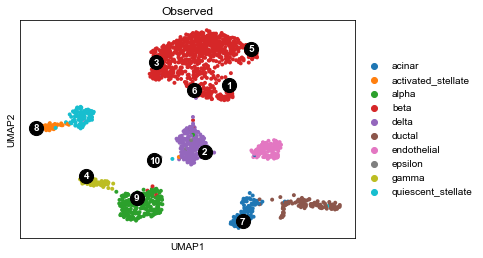

In [29]:
(fig, ax) = plt.subplots(1,1)
for num,i in enumerate(arch_loc):
    ax.scatter(X_umap[i,0], X_umap[i,1], s=200, c='k', zorder=3)
    ax.text(X_umap[i,0], X_umap[i,1], num+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':10,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="assigned_cluster", ax=ax, title='Observed', save='_baron_observed_nmf.pdf')

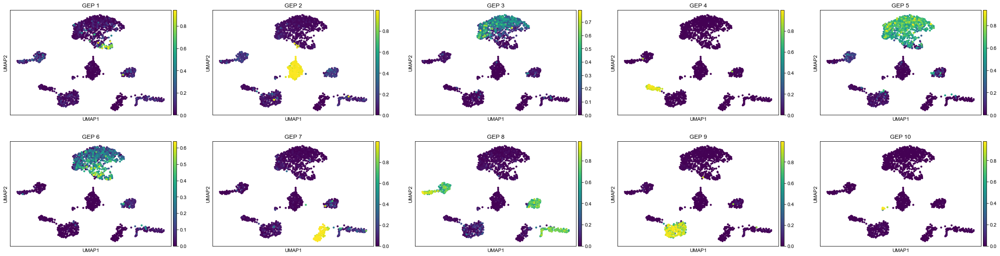

In [84]:
sc.pl.umap(adata, color=["GEP %s"%(i+1) for i in range(usage.shape[1])], ncols=5)

## UMAP based on usage matrix

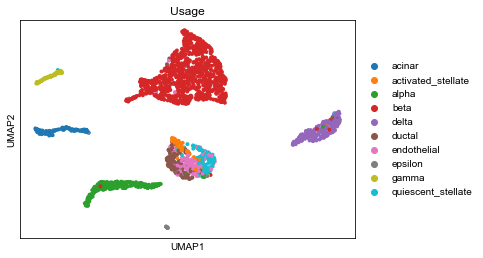

In [30]:
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_nmf", key_added="nmf", random_state=0)
sc.tl.umap(adata, neighbors_key="nmf", random_state=0)
sc.pl.umap(adata, color=["assigned_cluster"], title='Usage')

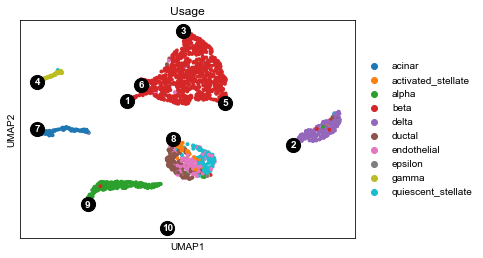

In [31]:
(fig, ax) = plt.subplots(1,1)
X_umap_usage = adata.obsm['X_umap']
for num,i in enumerate(arch_loc):
    ax.scatter(X_umap_usage[i,0], X_umap_usage[i,1], s=200, c='k', zorder=3)
    ax.text(X_umap_usage[i,0], X_umap_usage[i,1], num+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':10,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="assigned_cluster", ax=ax, title='Usage', save='_baron_usage_nmf.pdf')

In [32]:
# ASW
print(silhouette_score(adata.obsm['X_umap'], adata.obs['assigned_cluster']))
print(silhouette_score(adata.obsm['X_nmf'], adata.obs['assigned_cluster']))

0.4574289
0.52338535


## UMAP based on reconstructed matrix

In [33]:
adata_recon = adata.copy()
adata_recon.X = recon
sc.pp.normalize_total(adata_recon, target_sum=1e4)
sc.pp.log1p(adata_recon)
adata_recon.raw = adata_recon
sc.pp.regress_out(adata_recon, ['n_counts'])
sc.pp.scale(adata_recon, max_value=10)
sc.tl.pca(adata_recon, svd_solver='arpack')

In [34]:
sc.pp.neighbors(adata_recon, n_neighbors=20, n_pcs=35)
sc.tl.leiden(adata_recon, key_added="leiden_pca")
sc.tl.umap(adata_recon)

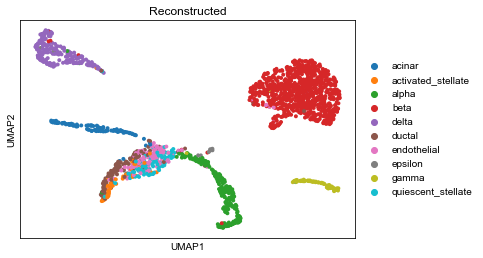

In [35]:
sc.pl.umap(adata_recon, color="assigned_cluster", title='Reconstructed')

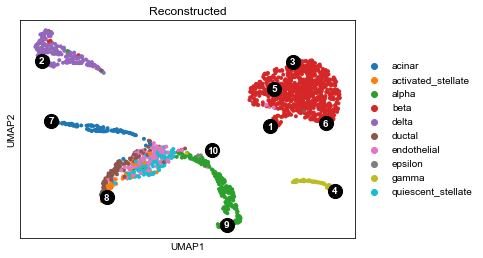

In [36]:
(fig, ax) = plt.subplots(1,1)
X_umap_recon = adata_recon.obsm['X_umap']
for num,i in enumerate(arch_loc):
    ax.scatter(X_umap_recon[i,0], X_umap_recon[i,1], s=200, c='k', zorder=3)
    ax.text(X_umap_recon[i,0], X_umap_recon[i,1], num+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':10,'weight':'bold'}, zorder=4)
sc.pl.umap(adata_recon, color="assigned_cluster", ax=ax, title='Reconstructed', save='_baron_reconstructed_nmf.pdf')

In [37]:
# ASW
print(silhouette_score(adata_recon.obsm['X_umap'], adata.obs['assigned_cluster']))
print(silhouette_score(adata_recon.obsm['X_nmf'], adata.obs['assigned_cluster']))

0.46318626
0.52338535


# Run scAAnet

In [9]:
from scAAnet.api import scAAnet

In [62]:
adata = sc.read_h5ad('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron.h5ad')
X_umap = adata.obsm['X_umap']

In [12]:
adata

AnnData object with n_obs × n_vars = 1908 × 2002
    obs: 'barcode', 'assigned_cluster', 'n_counts', 'n_genes'
    var: 'n_cells'
    uns: 'assigned_cluster_colors'
    obsm: 'X_umap'

## Select K

In [ ]:
from scAAnet.tools import StabilityArchetype, StabilityUsage, PlotConsensusMat, PlotArchDistMat

In [ ]:
# This was run on Slurm in parallel with each combination of K and rs
# K: 5-20
# rs: 1-30
dists = ['P', 'ZIP', 'NB', 'ZINB']
K = int(sys.argv[1])
rs = int(sys.argv[2])

methodmap = {"P": "poisson", "ZIP": "zipoisson", 'NB': 'nb', 'ZINB': 'zinb'}

counts = sc.read_h5ad('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron.h5ad')

hid_size = 128
batch_size = 64

epochs = 200

for dist in dists:
    preds, losses = scAAnet(counts, dispersion='gene-cell',
                         hidden_size=(hid_size, K, hid_size), ae_type=methodmap[dist],
                         epochs=epochs, batch_size=batch_size,
                         early_stop=100, reduce_lr=10, learning_rate=0.01, 
                         warm_up=20, random_state=rs, return_loss=True)
    
    recon, usage, spectra = preds['recon'], preds['usage'], preds['spectra']
    loss_value, loss_value_all = losses['loss'], losses['loss_all']

    usage = pd.DataFrame(usage, columns = np.arange(1,(K+1)), index=counts.obs.index)
    save_df_to_npz(usage, '/home/yw599/project/baron_data/baron/baron.usage.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
    
    spectra = pd.DataFrame(spectra.transpose(), columns = np.arange(1,(K+1)), index=counts.var.index)
    save_df_to_npz(spectra, '/home/yw599/project/baron_data/baron/baron.program.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
    
    recon = pd.DataFrame(recon, columns=counts.var.index, index=counts.obs.index)
    save_df_to_npz(recon, '/home/yw599/project/baron_data/baron/baron.recon.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
    
    open('/home/yw599/project/baron_data/baron.loss.values.wu20.txt', 'a+').write('%s\t%s\t%s\t%s\t%s\n'%(K, rs, dist, loss_value, loss_value_all))

In [ ]:
# Assess the stability of archetype
dists = ["P", "ZIP", "NB", "ZINB"]
filepath = '/home/yw599/project/baron_data/baron/baron.program.wu20.%s.rs%d.k%s.df.npz'
savepath = '/home/yw599/project/baron_data/baron/baron.arch.all.wu20.%s.k%s.df.npz'
stab_arch = StabilityArchetype(5, 20, 1, 30, dists, filepath, savepath)
save_df_to_npz(stab_arch, '/home/yw599/project/baron_data/baron.stability.arch.wu20.df.npz')

In [ ]:
# Plot archetype distance matrix of inferred usage
dists = ['P','ZIP','NB','ZINB']
K = np.arange(5,20+1)
colormap = sns.color_palette("coolwarm", as_cmap=True)
for k in K:
    for dist in dists:
        filepath = '/home/yw599/project/baron_data/baron/baron.arch.all.wu20.%s.k%s.df.npz' % (dist, k)
        savepath = '/home/yw599/project/baron_data/baron/baron.arch.clustering.wu20.%s.k%s.png' % (dist, k)
        PlotArchDistMat(filepath, savepath, colormap)

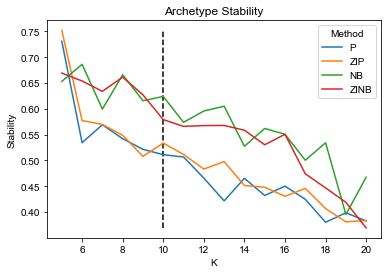

In [13]:
# Archetype stability over different Ks and distribution choices
stab_arch = load_df_from_npz('/home/yw599/project/baron_data/baron.stability.arch.wu20.df.npz')
stab_arch = stab_arch.astype({'K': 'int32', 'Stability': 'float', 'Method': 'str'})
g = sns.lineplot(x= 'K', y = 'Stability', hue = 'Method', data=stab_arch)
g.set_title('Archetype Stability')
g.vlines(10, ymin=stab_arch.Stability.min(), ymax=stab_arch.Stability.max(), linestyle='--', colors='black')

In [ ]:
# Assess the stability of usage
dists = ["P", "ZIP", "NB", "ZINB"]
filepath = '/home/yw599/project/baron_data/baron/baron.usage.wu20.%s.rs%d.k%s.df.npz'
filepath_consensus = '/home/yw599/project/baron_data/baron/baron.consensus.matrix.wu20.%s.k%s.npy'
n_cells = 1908
stab_usage = StabilityUsage(5, 20, 1, 30, dists, n_cells, filepath, filepath_consensus, cluster=True, n_cells_max=50000)
save_df_to_npz(stab_usage, '/home/yw599/project/baron_data/baron.stability.usage.wu20.df.npz')

In [ ]:
# Plot consensus clustering matrix of inferred usage
dists = ['P','ZIP','NB','ZINB']
K = np.arange(5,20+1)
colormap = sns.color_palette("coolwarm", as_cmap=True)
for k in K:
    for dist in dists:
        filepath = '/home/yw599/project/baron_data/baron/baron.consensus.matrix.wu20.%s.k%s.npy' % (dist, k)
        savepath = '/home/yw599/project/baron_data/baron/baron.consensus.matrix.wu20.%s.k%s.png' % (dist, k)
        PlotConsensusMat(filepath, savepath, colormap)

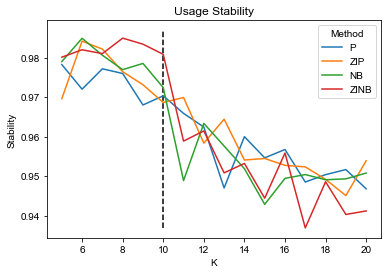

In [15]:
# Usage stability over different Ks and distribution choices
stab_usage = load_df_from_npz('/home/yw599/project/baron_data/baron.stability.usage.wu20.df.npz')
stab_usage = stab_usage.astype({'K': 'int32', 'Stability': 'float', 'Method': 'str'})
g = sns.lineplot(x= 'K', y = 'Stability', hue = 'Method', data=stab_usage)
g.set_title('Usage Stability')
g.vlines(10, ymin=stab_usage.Stability.min(), ymax=stab_usage.Stability.max()+0.002, linestyle='--', colors='black')

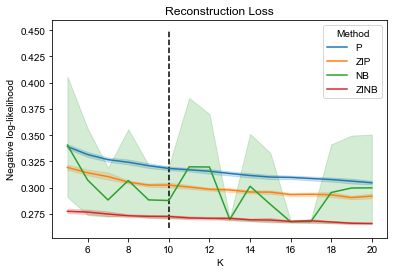

In [10]:
# Loss over different Ks and distribution choices
loss_all = pd.read_csv('/home/yw599/project/baron_data/baron.loss.values.wu20.txt', sep='\t', header=None)
loss_all.columns = ['K','random state', 'Method', 'Loss','Loss_all']
loss_all = loss_all.astype({'K': 'int32', 'Loss': 'float', 'Loss_all': 'float', 'Method': 'category'})
loss_all['Method'] = loss_all['Method'].cat.reorder_categories(['P', 'ZIP', 'NB', 'ZINB'])
g = sns.lineplot(x= 'K', y = 'Loss', hue = 'Method', data=loss_all)
g.set_title('Reconstruction Loss')
g.set_ylabel('Negative log-likelihood')
g.vlines(10, ymin=loss_all.Loss.min(), ymax=0.45, linestyle='--', colors='black')

## Rerun scAAnet with selected K and larger epoch number

In [63]:
dist = 'ZINB'
rs = 8
K = 10
batch_size = 64
hid_size = 128
epochs = 400

In [10]:
methodmap = {"P": "poisson", "ZIP": "zipoisson", 'NB': 'nb', 'ZINB': 'zinb'}
preds = scAAnet(adata, dispersion='gene-cell',
                         hidden_size=(hid_size, K, hid_size), ae_type=methodmap[dist],
                         epochs=epochs, batch_size=batch_size,
                         early_stop=100, reduce_lr=10, learning_rate=0.01, 
                         warm_up=20, random_state=rs)

Training loss at epoch 0 (for the last batch): 0.8300
Learning rate is: 0.010000
<tf.Variable 'z_fixed:0' shape=(8, 7) dtype=float32, numpy=
array([[ 1.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ],
       [-0.14285715,  0.9897433 ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ],
       [-0.14285715, -0.16495723,  0.97590005,  0.        ,  0.        ,
         0.        ,  0.        ],
       [-0.14285715, -0.16495723, -0.19518001,  0.9561829 ,  0.        ,
         0.        ,  0.        ],
       [-0.14285715, -0.16495723, -0.19518001, -0.23904572,  0.9258201 ,
         0.        ,  0.        ],
       [-0.14285715, -0.16495723, -0.19518001, -0.23904572, -0.3086067 ,
         0.8728716 ,  0.        ],
       [-0.14285715, -0.16495723, -0.19518001, -0.23904572, -0.3086067 ,
        -0.4364358 ,  0.75592893],
       [-0.14285715, -0.16495723, -0.19518001, -0.23904572, -0.3086067 ,
        -0.4364358 , -0.755928

In [12]:
recon, usage, spectra = preds['recon'], preds['usage'], preds['spectra']

In [31]:
usage = pd.DataFrame(usage, columns = np.arange(1,(K+1)), index=adata.obs.index)
spectra = pd.DataFrame(spectra.transpose(), columns = np.arange(1,(K+1)), index=adata.var.index)
recon = pd.DataFrame(recon, columns=adata.var.index, index=adata.obs.index)

In [32]:
save_df_to_npz(spectra, '/home/yw599/project/baron_data/baron.program.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
save_df_to_npz(usage, '/home/yw599/project/baron_data/baron.usage.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
save_df_to_npz(recon, '/home/yw599/project/baron_data/baron.recon.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))

/gpfs/ysm/home/yw599/venv/lib64/python3.6/site-packages/numpy/lib/format.py:356: UserWarning: metadata on a dtype may be saved or ignored, but will raise if saved when read. Use another form of storage.
  d['descr'] = dtype_to_descr(array.dtype)


In [40]:
spectra = load_df_from_npz('/home/yw599/project/baron_data/baron.program.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
usage = load_df_from_npz('/home/yw599/project/baron_data/baron.usage.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
recon = load_df_from_npz('/home/yw599/project/baron_data/baron.recon.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))

## Assess the sparsity of inferred usage through minimum usage

In [41]:
adata.obs['min_usage'] = usage.min(1)
adata.obs["min_range"] = pd.cut(adata.obs['min_usage'], bins=[0,0.01,0.02,0.05,0.1,1.], right=False)
df = adata.obs.groupby(["min_range", "assigned_cluster"]).size().to_frame()
df.reset_index(inplace=True)
df = df.rename(columns={0:'count'})
df['per'] = df['count']
temp = df.groupby(["assigned_cluster"]).sum()['count']
for c in temp.index:
    df.loc[df['assigned_cluster'] == c,'per'] = df[df['assigned_cluster'] == c]['per']/temp[c]

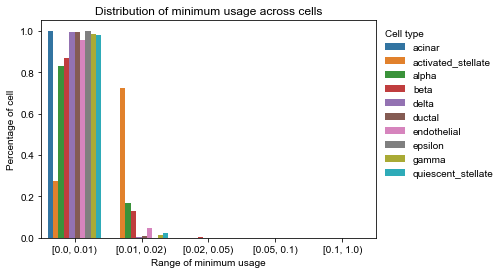

In [44]:
g = sns.barplot(x='min_range',y='per',hue='assigned_cluster', data=df)
g.set_ylabel('Percentage of cell')
g.set_xlabel('Range of minimum usage')
g.set_title('Distribution of minimum usage across cells')
handles, labels = g.get_legend_handles_labels()
leg = g.legend(handles, labels, 
             bbox_to_anchor=(1, 1), loc=2, title='Cell type', frameon=False)
leg._legend_box.align = "left"

## Assess the sharing of GEPs through maximum usage

In [45]:
adata.obs['max_usage'] = usage.max(1)
adata.obs["max_range"] = pd.cut(adata.obs['max_usage'], bins=[0,0.2,0.4,0.6,0.8,1.], right=False)
df = adata.obs.groupby(["max_range", "assigned_cluster"]).size().to_frame()
df.reset_index(inplace=True)
df = df.rename(columns={0:'count'})
df['per'] = df['count']
temp = df.groupby(["assigned_cluster"]).sum()['count']
for c in temp.index:
    df.loc[df['assigned_cluster'] == c,'per'] = df[df['assigned_cluster'] == c]['per']/temp[c]

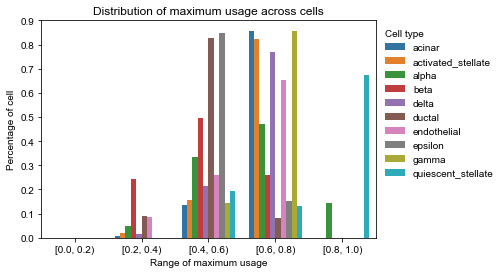

In [47]:
g = sns.barplot(x='max_range',y='per',hue='assigned_cluster', data=df)
g.set_ylabel('Percentage of cell')
g.set_xlabel('Range of maximum usage')
g.set_title('Distribution of maximum usage across cells')
handles, labels = g.get_legend_handles_labels()
leg = g.legend(handles, labels, 
             bbox_to_anchor=(1, 1), loc=2, title='Cell type', frameon=False)
leg._legend_box.align = "left"

## MDS visualization of archetypal space

In [48]:
from sklearn.manifold import MDS

In [49]:
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

<Figure size 432x288 with 0 Axes>

In [56]:
data_at = usage.to_numpy()
embedding = MDS(n_components=2)
Y_mds_ats = embedding.fit_transform(np.transpose(spectra))
Y_mds_data = data_at @ Y_mds_ats

In [59]:
(fig, ax) = plt.subplots(2,5,figsize=(25, 8), dpi=600)
plt.suptitle('')
for i in range(2):
    for j in range(5):
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])
        ax[i,j].set_xlabel('MDS1', fontsize=15)
        ax[i,j].set_ylabel('MDS2', fontsize=15)
        g = ax[i,j].scatter(Y_mds_data[:,0], Y_mds_data[:,1], s=1, alpha=0.5,
                   cmap='inferno', c=usage.iloc[:, i*5+j], vmin=0, vmax=1)
        ax[i,j].set_title('GEP %d' % (i*5+j+1), fontsize=12)
        ax[i,j].scatter(Y_mds_ats[:,0], Y_mds_ats[:,1], s=200, c='r', zorder=3)
        for k in range(Y_mds_ats.shape[0]):
            ax[i,j].text(Y_mds_ats[k,0], Y_mds_ats[k,1], k+1, horizontalalignment='center', verticalalignment='center', fontdict={'color': 'white','size':15,'weight':'bold'}, zorder=4)
    #plt.colorbar(g, ax=ax[i, j])
fig.tight_layout()

In [60]:
adata.obsm['X_umap'] = Y_mds_data

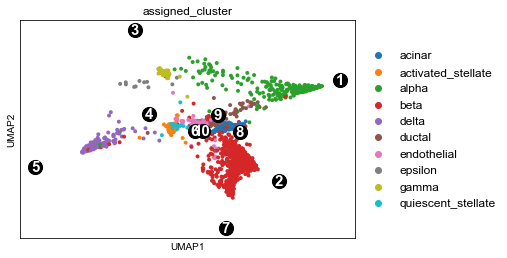

In [61]:
(fig, ax) = plt.subplots(1,1)
for i in range(K):
    ax.scatter(Y_mds_ats[i,0], Y_mds_ats[i,1], s=200, c='k', zorder=3)
    ax.text(Y_mds_ats[i,0], Y_mds_ats[i,1], i+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':15,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="assigned_cluster", ax=ax, legend_fontsize=12, save='_baron_MDS.pdf')

## UMAP Visualization

In [65]:
for i in range(usage.shape[1]):
    adata.obs["GEP %s"%(i+1)] = usage.iloc[:,i]
adata.obsm["X_scaanet"] = usage

In [66]:
arch_loc = usage.to_numpy().argmax(0)

In [67]:
arch_loc

array([ 861,  880,  516, 1184,  818, 1005,  965,  379,  777, 1748])

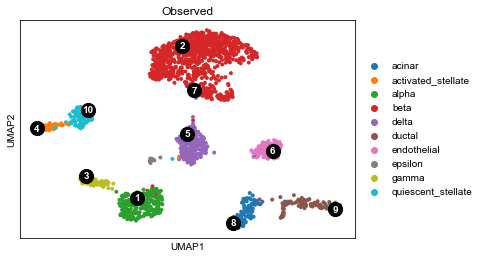

In [69]:
(fig, ax) = plt.subplots(1,1)
for num,i in enumerate(arch_loc):
    ax.scatter(X_umap[i,0], X_umap[i,1], s=200, c='k', zorder=3)
    ax.text(X_umap[i,0], X_umap[i,1], num+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':10,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="assigned_cluster", ax=ax, title='Observed', save='_baron_observed.pdf')

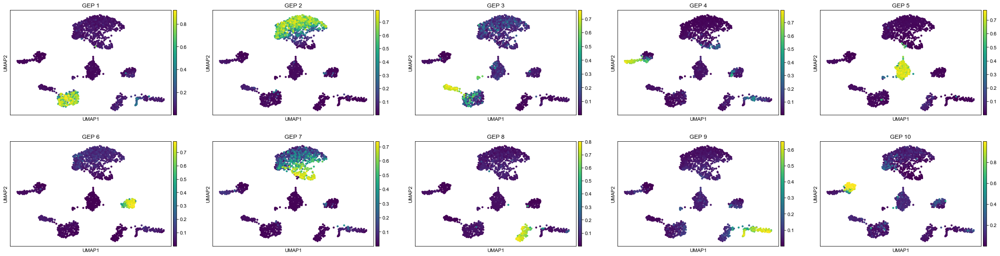

In [23]:
sc.pl.umap(adata, color=["GEP %s"%(i+1) for i in range(usage.shape[1])], ncols=5, save='_baron_observed_usage.pdf')

## UMAP based on usage matrix

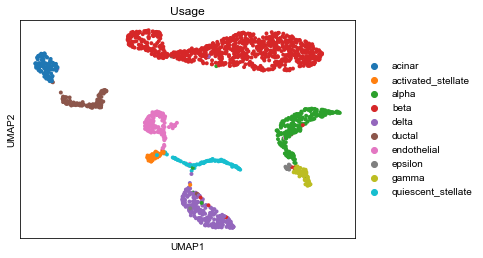

In [78]:
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scaanet", key_added="scaanet", random_state=0)
sc.tl.umap(adata, neighbors_key="scaanet", random_state=0)
sc.pl.umap(adata, color=["assigned_cluster"], title='Usage')

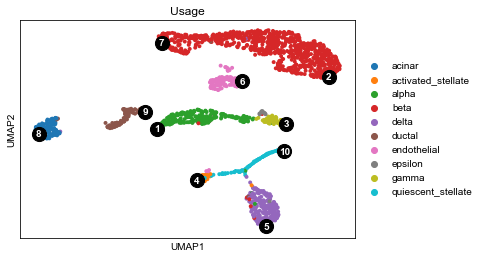

In [59]:
(fig, ax) = plt.subplots(1,1)
X_umap_usage = adata.obsm['X_umap']
for num,i in enumerate(arch_loc):
    ax.scatter(X_umap_usage[i,0], X_umap_usage[i,1], s=200, c='k', zorder=3)
    ax.text(X_umap_usage[i,0], X_umap_usage[i,1], num+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':10,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="assigned_cluster", ax=ax, title='Usage', save='_baron_usage.pdf')

In [67]:
# ASW
print(silhouette_score(adata.obsm['X_umap'], adata.obs['assigned_cluster']))
print(silhouette_score(adata.obsm['X_scaanet'], adata.obs['assigned_cluster']))

0.423503
0.57051194


## UMAP based on reconstructed matrix

In [81]:
adata_recon = adata.copy()
adata_recon.X = recon
sc.pp.normalize_total(adata_recon, target_sum=1e4)
sc.pp.log1p(adata_recon)
adata_recon.raw = adata_recon
sc.pp.regress_out(adata_recon, ['n_counts'])
sc.pp.scale(adata_recon, max_value=10)
sc.tl.pca(adata_recon, svd_solver='arpack')

In [82]:
sc.pp.neighbors(adata_recon, n_neighbors=20, n_pcs=35)
sc.tl.leiden(adata_recon, key_added="leiden_pca")
sc.tl.umap(adata_recon)

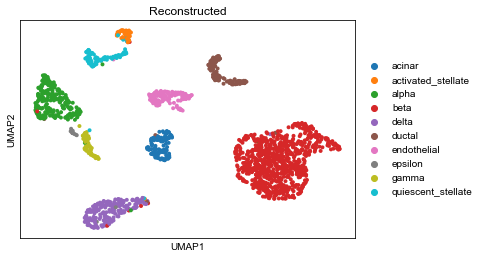

In [83]:
sc.pl.umap(adata_recon, color="assigned_cluster", title='Reconstructed')

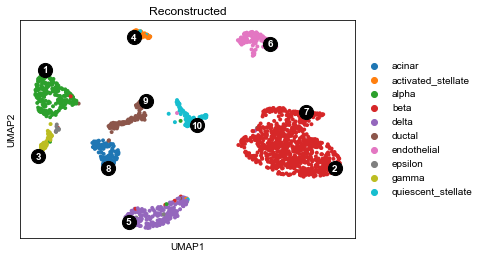

In [65]:
(fig, ax) = plt.subplots(1,1)
X_umap_recon = adata_recon.obsm['X_umap']
for num,i in enumerate(arch_loc):
    ax.scatter(X_umap_recon[i,0], X_umap_recon[i,1], s=200, c='k', zorder=3)
    ax.text(X_umap_recon[i,0], X_umap_recon[i,1], num+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':10,'weight':'bold'}, zorder=4)
sc.pl.umap(adata_recon, color="assigned_cluster", ax=ax, title='Reconstructed', save='_baron_reconstructed.pdf')

In [72]:
# ASW
print(silhouette_score(adata_recon.obsm['X_umap'], adata.obs['assigned_cluster']))
print(silhouette_score(adata_recon.obsm['X_scaanet'], adata.obs['assigned_cluster']))

0.3082964
0.57051194


# Various plots

In [66]:
sorted_index = adata.obs.sort_values(by='assigned_cluster').index
usage_sorted = usage.loc[sorted_index]
usage_sorted = usage_sorted.loc[:,[2,3,4,7,5,8,6,1]]

In [67]:
gep_order = [2,3,4,7,5,8,6,1]
gep_order = [10,1,5,8,6,3,7,2,9,4]
usage_sorted = usage.loc[:,gep_order]
usage_sorted.columns = ['GEP %d'%i for i in usage_sorted.columns]

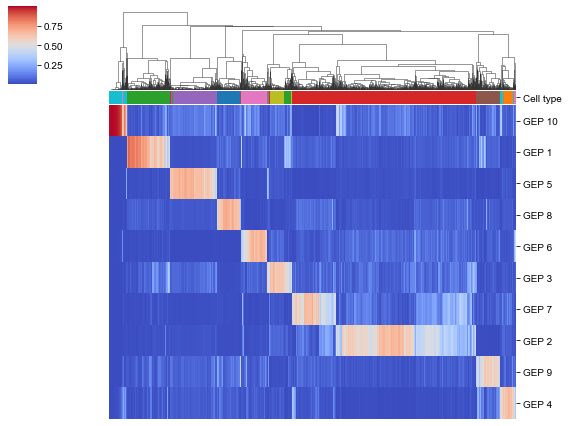

In [70]:
# Heatmap of cell usage matrix
lut = dict(zip(adata.obs["assigned_cluster"].cat.categories, adata.uns['assigned_cluster_colors']))
col_colors = adata.obs['assigned_cluster'].map(lut).rename('Cell type')
cmap = sns.color_palette("coolwarm", as_cmap=True)
sns.clustermap(usage_sorted.transpose(), xticklabels=False, figsize=(8,6),
               row_cluster=False, col_cluster=True, col_colors=col_colors, cmap=cmap)

In [71]:
ct_order = ['endothelial', 'delta', 'acinar', 'quiescent_stellate', 'activated_stellate', 
            'ductal', 'alpha', 'gamma', 'epsilon', 'beta']
ct_order = ['quiescent_stellate', 'alpha', 'delta', 'acinar', 'endothelial', 'gamma', 'epsilon',
           'beta', 'ductal', 'activated_stellate']
cmap = sns.color_palette("rocket_r", as_cmap=True)

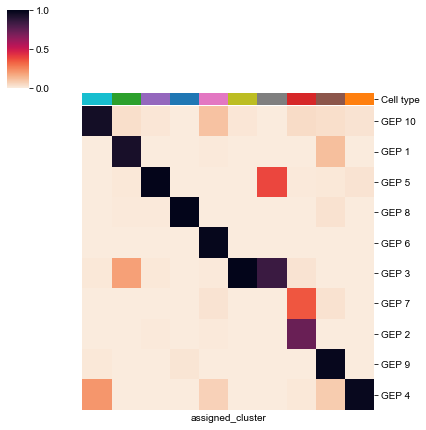

In [72]:
# % Cells With GEP Usage > 25% by Published Cluster
percent_group_usage = usage.groupby(adata.obs["assigned_cluster"], axis=0).apply(lambda x: (x>.25).mean())
percent_group_usage = percent_group_usage.loc[:,gep_order]
percent_group_usage.columns = ['GEP %d'%i for i in percent_group_usage.columns]
percent_group_usage = percent_group_usage.loc[ct_order]
lut = dict(zip(adata.obs["assigned_cluster"].cat.categories, adata.uns['assigned_cluster_colors']))
col_colors = percent_group_usage.index.map(lut).rename('Cell type')
col_colors = pd.DataFrame(col_colors, index=ct_order)
sns.clustermap(percent_group_usage.transpose(), xticklabels=False, figsize=(6,6),
               row_cluster=False, col_cluster=False, col_colors=col_colors, cmap=cmap)

# Look at GEPs

### Original normalized gene scores returned by scAAnet

In [84]:
spectra

,1,2,3,4,5,6,7,8,9,10
GCG,8.561504e-01,8.811397e-05,3.175633e-05,2.623829e-05,3.852636e-05,2.164352e-04,4.918978e-05,3.112275e-06,9.071736e-05,1.977265e-03
PPY,4.471666e-04,1.140307e-04,9.900567e-01,3.199227e-05,1.081241e-04,1.393967e-03,6.229092e-05,6.371468e-05,1.861786e-04,1.439123e-03
A2M,2.186011e-07,7.207894e-10,4.198009e-14,5.745182e-04,3.641348e-08,6.509241e-05,9.370674e-13,1.837504e-11,3.126252e-13,6.229745e-04
AADAC,4.880358e-08,1.202972e-08,3.046973e-11,2.728808e-07,8.387730e-07,5.736037e-09,7.359829e-09,1.083158e-06,5.129044e-10,3.680735e-06
ABCA4,1.254088e-07,2.914643e-09,1.879001e-12,6.469537e-08,4.517696e-07,7.391110e-09,6.469577e-10,1.089935e-09,1.278904e-09,2.178175e-06
...,...,...,...,...,...,...,...,...,...,...
ZSWIM5,5.225290e-06,6.662803e-07,3.322368e-07,2.335109e-10,6.847145e-07,1.014255e-09,7.668397e-07,2.312843e-09,3.452704e-08,4.232966e-06
ZWILCH,9.168606e-06,4.899910e-07,3.791514e-07,8.854662e-07,2.126753e-07,7.651544e-06,2.132331e-09,5.955218e-07,3.992710e-06,2.705822e-06
ZXDA,2.330990e-07,1.838910e-08,9.175458e-13,6.719953e-09,5.108652e-07,7.932722e-10,1.673383e-08,1.278819e-08,1.632328e-09,5.169290e-07
ZXDB,4.359561e-06,3.128941e-06,3.308014e-07,3.657512e-07,6.345554e-07,7.936802e-06,6.983310e-06,2.251030e-08,1.607475e-05,2.428579e-05


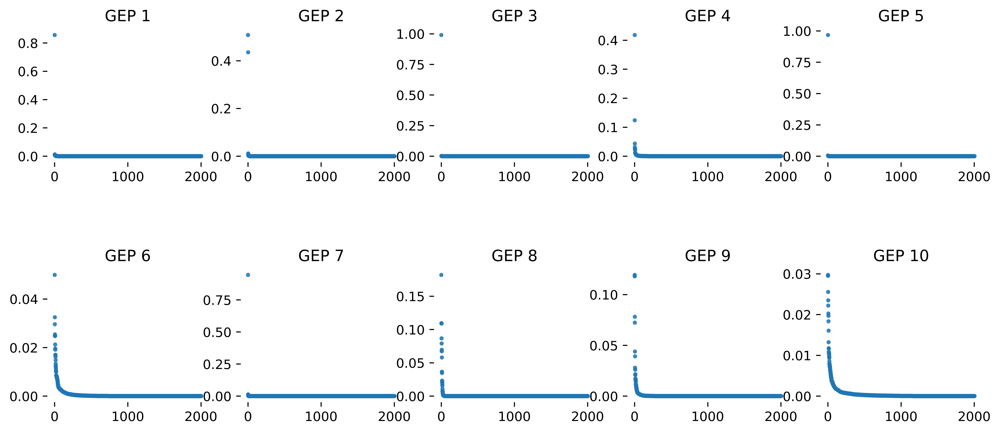

In [567]:
# Ranked gene scores in each GEP
plotRankedGeneScore(spectra, ncol=ncol)

In [568]:
# Get ranks of each gene in each GEP
spectra_rank = spectra.copy()
for i in range(spectra.shape[1]):
    spectra_rank.iloc[:,i] = spectra.iloc[:,i].rank(ascending=False)
spectra_rank.loc[['PPY','GHRL','PDGFRB'],:]

,1,2,3,4,5,6,7,8,9,10
PPY,54.0,47.0,1.0,395.0,39.0,144.0,60.0,56.0,207.0,141.0
GHRL,883.0,568.0,283.0,797.0,489.0,994.0,815.0,896.0,982.0,982.0
PDGFRB,1354.0,1162.0,1099.0,25.0,1372.0,1446.0,1360.0,955.0,1212.0,28.0


In [569]:
# Number of genes in each GEP with score >= 0.01
thr = 0.01
for (i,program) in enumerate(spectra.columns):
    spectra_sub = spectra.sort_values(by=spectra.columns[i], axis=0, ascending=False).iloc[:,i]
    value = spectra_sub.to_numpy()
    num = np.sum(value >= thr)
    print('GEP %s'%program, ':', num)
    print(spectra_sub.index[:(num)])

GEP 1 : 2
Index(['GCG', 'TM4SF4'], dtype='object')
GEP 2 : 4
Index(['IAPP', 'INS', 'CPE', 'CHGA'], dtype='object')
GEP 3 : 1
Index(['PPY'], dtype='object')
GEP 4 : 10
Index(['TIMP1', 'COL1A1', 'COL6A1', 'COL6A2', 'BGN', 'COL6A3', 'SPARC', 'OSR2',
       'IGFBP7', 'SERPINH1'],
      dtype='object')
GEP 5 : 1
Index(['SST'], dtype='object')
GEP 6 : 19
Index(['IGFBP7', 'TMSB10', 'PLVAP', 'TMSB4X', 'HLA-B', 'SERPINE1', 'PXDN',
       'SPARC', 'TP53I11', 'CD59', 'COL4A1', 'ACKR3', 'VWF', 'IFITM3', 'INSR',
       'THBS1', 'ENG', 'ESM1', 'LGALS1'],
      dtype='object')
GEP 7 : 3
Index(['INS', 'HERPUD1', 'HSPA5'], dtype='object')
GEP 8 : 16
Index(['REG1A', 'PRSS2', 'CTRB2', 'REG1B', 'CPA1', 'PLA2G1B', 'CTRB1', 'PRSS1',
       'CELA3A', 'CPB1', 'CLPS', 'CELA3B', 'SPINK1', 'SERPINA3', 'PNLIP',
       'SYCN'],
      dtype='object')
GEP 9 : 20
Index(['SERPINA3', 'SERPINA1', 'ANXA4', 'SPP1', 'TMSB4X', 'KRT18', 'CD44',
       'PMEPA1', 'KRT8', 'CTGF', 'IER3', 'DUSP1', 'ACTG1', 'TPM1', 'IGFBP7',
    

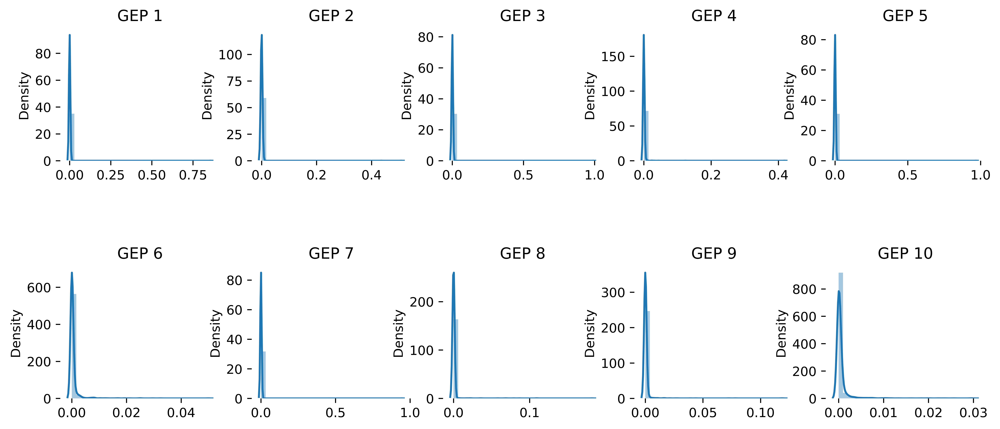

In [571]:
# Density plot of gene scores in each GEP
plotDensity(spectra, ncol)

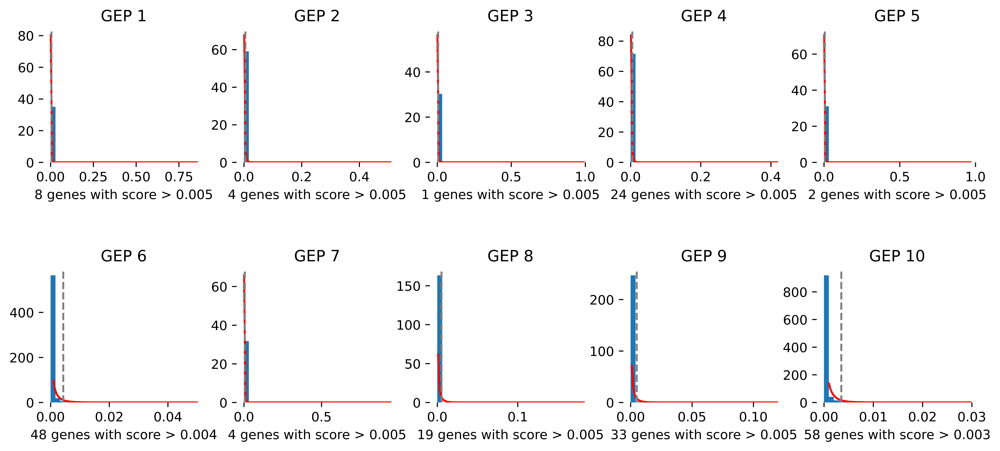

In [572]:
# Density plot of gene scores fitted by Gamma distributions in each GEP
gep_genes = plotDensityGamma(spectra, ncol)

In [573]:
gep_genes

{'GEP 1': Index(['GCG', 'TM4SF4', 'ALDH1A1', 'CLU', 'CHGB', 'CPE', 'CHGA', 'VGF'], dtype='object'),
 'GEP 2': Index(['IAPP', 'INS', 'CPE', 'CHGA'], dtype='object'),
 'GEP 3': Index(['PPY'], dtype='object'),
 'GEP 4': Index(['TIMP1', 'COL1A1', 'COL6A1', 'COL6A2', 'BGN', 'COL6A3', 'SPARC', 'OSR2',
        'IGFBP7', 'SERPINH1', 'COL1A2', 'COL15A1', 'IFITM3', 'SPON2', 'THY1',
        'COL5A1', 'TMSB10', 'CD59', 'TIMP3', 'TGFBI', 'IGFBP4', 'SLC1A7',
        'PLAU', 'CRISPLD2'],
       dtype='object'),
 'GEP 5': Index(['SST', 'CPE'], dtype='object'),
 'GEP 6': Index(['IGFBP7', 'TMSB10', 'PLVAP', 'TMSB4X', 'HLA-B', 'SERPINE1', 'PXDN',
        'SPARC', 'TP53I11', 'CD59', 'COL4A1', 'ACKR3', 'VWF', 'IFITM3', 'INSR',
        'THBS1', 'ENG', 'ESM1', 'LGALS1', 'ITGA5', 'HSPG2', 'VWA1', 'LDHB',
        'IL32', 'CLIC4', 'FSCN1', 'PPAP2B', 'CXCR4', 'PRSS23', 'IFITM2',
        'SERPINH1', 'STC1', 'LAMA4', 'ITGA1', 'RGCC', 'NQO1', 'THY1', 'GMFG',
        'HTRA1', 'INS', 'SST', 'MARCKSL1', 'LAMC1', 'F2R'

### New gene scores based on cisTopic

In [85]:
gene_score = geneScore(spectra)

In [ ]:
ncol=5

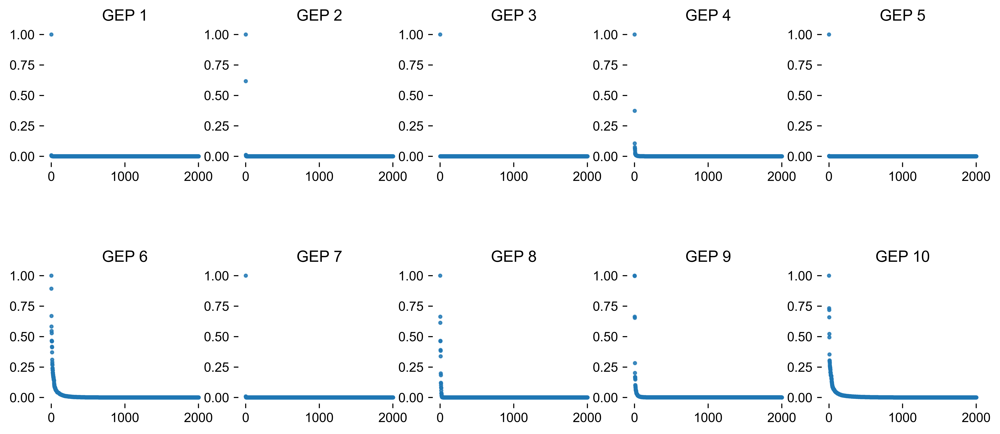

In [86]:
# Ranked gene scores in each GEP
plotRankedGeneScore(gene_score, ncoldd)

In [576]:
# Number of genes in each GEP with score >= 0.01
thr = 0.01
for (i,program) in enumerate(gene_score.columns):
    spectra_sub = gene_score.sort_values(by=gene_score.columns[i], axis=0, ascending=False).iloc[:,i]
    value = spectra_sub.to_numpy()
    num = np.sum(value >= thr)
    print('GEP %s'%program, ':', num)
    print(spectra_sub.index[:(num)])

GEP 1 : 1
Index(['GCG'], dtype='object')
GEP 2 : 4
Index(['IAPP', 'INS', 'CHGA', 'CPE'], dtype='object')
GEP 3 : 1
Index(['PPY'], dtype='object')
GEP 4 : 19
Index(['TIMP1', 'COL1A1', 'COL6A1', 'COL6A2', 'COL6A3', 'BGN', 'SPARC', 'OSR2',
       'COL1A2', 'COL15A1', 'SERPINH1', 'SPON2', 'THY1', 'COL5A1', 'IGFBP7',
       'TGFBI', 'TIMP3', 'IFITM3', 'SLC1A7'],
      dtype='object')
GEP 5 : 1
Index(['SST'], dtype='object')
GEP 6 : 219
Index(['IGFBP7', 'PLVAP', 'SERPINE1', 'TMSB10', 'PXDN', 'HLA-B', 'ACKR3',
       'TP53I11', 'SPARC', 'VWF',
       ...
       'PARP14', 'LBH', 'KANK3', 'HIC1', 'BST2', 'DHRS3', 'SLC9A3R2', 'JAG1',
       'PLEC', 'PDIA4'],
      dtype='object', length=219)
GEP 7 : 1
Index(['INS'], dtype='object')
GEP 8 : 23
Index(['REG1A', 'PRSS2', 'CTRB2', 'CPA1', 'REG1B', 'CTRB1', 'PLA2G1B', 'PRSS1',
       'CELA3A', 'CPB1', 'CLPS', 'CELA3B', 'SPINK1', 'PNLIP', 'SERPINA3',
       'SYCN', 'CPA2', 'PRSS3', 'CELA2A', 'REG3G', 'CTRC', 'CUZD1', 'KLK1'],
      dtype='object')
GEP 

In [577]:
# Top 20 genes
num = 20
for (i,program) in enumerate(gene_score.columns):
    spectra_sub = gene_score.sort_values(by=gene_score.columns[i], axis=0, ascending=False).iloc[:,i]
    print('GEP %s'%program, ':', num)
    print(spectra_sub.index[:(num)])

GEP 1 : 20
Index(['GCG', 'TM4SF4', 'ALDH1A1', 'CHGB', 'CLU', 'VGF', 'CHGA', 'CPE',
       'LOXL4', 'PDK4', 'TMEM176A', 'MUC13', 'GC', 'RDH16', 'IRX2', 'PEG10',
       'RGS4', 'G6PC2', 'CAMK2G', 'GAPDH'],
      dtype='object')
GEP 2 : 20
Index(['IAPP', 'INS', 'CHGA', 'CPE', 'PCSK1', 'VGF', 'CHGB', 'DLK1', 'ABCC8',
       'G6PC2', 'SYT16', 'GAPDH', 'BTK', 'PEG10', 'CDKN1C', 'HSPA5', 'MSI2',
       'IER3', 'EDN3', 'C2CD4A'],
      dtype='object')
GEP 3 : 20
Index(['PPY', 'TM4SF4', 'CARTPT', 'CLU', 'CHGB', 'ALDH1A1', 'MT1G', 'AQP3',
       'MT1M', 'SERTM1', 'KCNG1', 'PTP4A3', 'CALY', 'PDK4', 'STMN2', 'MT1E',
       'FEV', 'SMOC1', 'SPOCK1', 'ARX'],
      dtype='object')
GEP 4 : 20
Index(['TIMP1', 'COL1A1', 'COL6A1', 'COL6A2', 'COL6A3', 'BGN', 'SPARC', 'OSR2',
       'COL1A2', 'COL15A1', 'SERPINH1', 'SPON2', 'THY1', 'COL5A1', 'IGFBP7',
       'TGFBI', 'TIMP3', 'IFITM3', 'SLC1A7', 'CRISPLD2'],
      dtype='object')
GEP 5 : 20
Index(['SST', 'CPE', 'CHGB', 'PCSK1', 'RBP4', 'EDN3', 'CHGA', 'PCK

In [181]:
# Get ranks of each gene in each GEP
spectra_rank = gene_score.copy()
for i in range(gene_score.shape[1]):
    spectra_rank.iloc[:,i] = gene_score.iloc[:,i].rank(ascending=False)
spectra_rank.loc[markers_gene+['PPY','GHRL','PDGFRB','HERPUD1','DDIT3','HSPA5','MAFA','CHGA'],:]

,1,2,3,4,5,6,7,8,9,10
GCG,1.0,1989.0,1988.0,1995.0,1986.0,815.0,1989.0,1947.0,1998.0,153.0
INS,93.0,2.0,1990.0,2000.0,2002.0,126.0,1.0,2001.0,2002.0,12.0
SST,26.0,2002.0,1999.0,2002.0,1.0,118.0,2002.0,2000.0,2001.0,16.0
PPY,1980.0,1997.0,1.0,1998.0,1994.0,257.0,1996.0,1996.0,2000.0,305.0
KRT19,352.0,1662.0,1738.0,1436.0,1673.0,1852.0,1422.0,1718.0,39.0,955.0
CPA1,1968.0,1962.0,1876.0,1948.0,1941.0,551.0,1974.0,4.0,1988.0,855.0
PDGFRB,1405.0,1191.0,1125.0,23.0,1093.0,1738.0,1052.0,1315.0,1496.0,22.0
VWF,1810.0,844.0,938.0,1557.0,1177.0,10.0,1519.0,1222.0,717.0,943.0
GHRL,1549.0,1413.0,1574.0,1513.0,1406.0,923.0,1320.0,1162.0,1582.0,939.0
PPY,1980.0,1997.0,1.0,1998.0,1994.0,257.0,1996.0,1996.0,2000.0,305.0


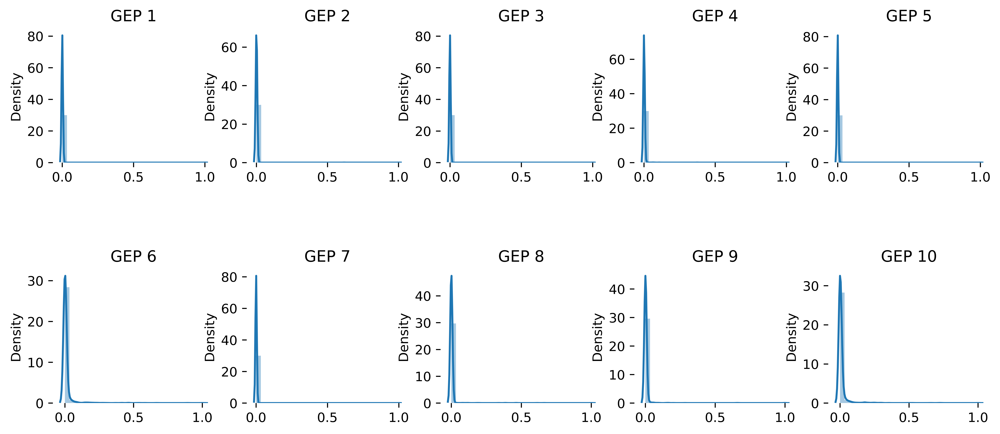

In [579]:
# Density plot of gene scores in each GEP
plotDensity(gene_score, ncol)

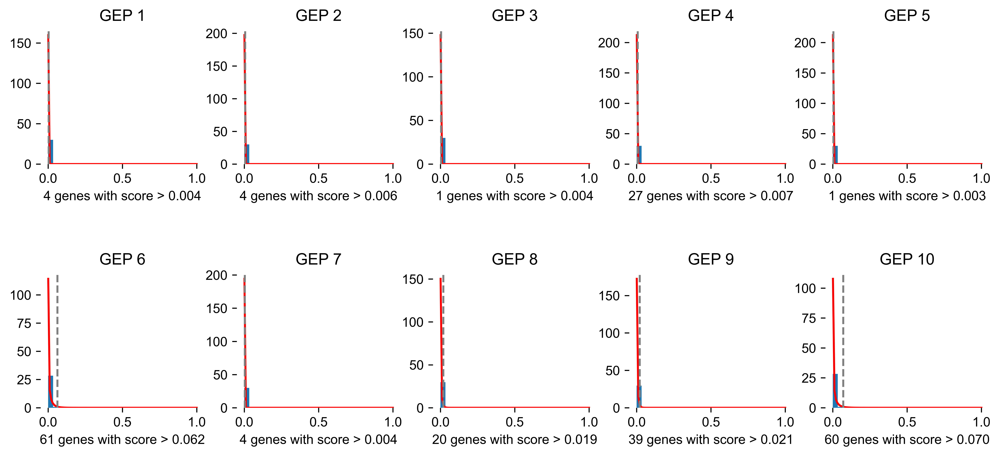

In [87]:
# Density plot of gene scores fitted by Gamma distributions in each GEP
gep_genes_new = plotDensityGamma(gene_score, ncol=5)
#plt.savefig('/ysm-gpfs/pi/zhao/yw599/scAAnet/figures/select_top_genes.pdf', bbox_inches="tight")
#plt.close()

In [296]:
for k in gep_genes_new.keys():
    print ('%s:'%k, '[%s]' % ', '.join(map(str, gep_genes_new[k])))
    print('\n')

GEP 1: [GCG, TM4SF4, ALDH1A1, CHGB]


GEP 2: [IAPP, INS, CHGA, CPE]


GEP 3: [PPY]


GEP 4: [TIMP1, COL1A1, COL6A1, COL6A2, COL6A3, BGN, SPARC, OSR2, COL1A2, COL15A1, SERPINH1, SPON2, THY1, COL5A1, IGFBP7, TGFBI, TIMP3, IFITM3, SLC1A7, CRISPLD2, IGFBP4, PLAU, PDGFRB, COL3A1, AEBP1, FAP, TMSB10]


GEP 5: [SST]


GEP 6: [IGFBP7, PLVAP, SERPINE1, TMSB10, PXDN, HLA-B, ACKR3, TP53I11, SPARC, VWF, COL4A1, TMSB4X, INSR, ESM1, THBS1, ENG, IFITM3, CD59, LGALS1, ITGA5, CXCR4, HSPG2, FSCN1, CLIC4, PPAP2B, STC1, VWA1, IL32, LDHB, RGCC, LAMA4, GMFG, NQO1, THY1, ITGA1, SERPINH1, IFITM2, HTRA1, PRSS23, MARCKSL1, F2R, FAM198B, DOCK9, MSN, NOTCH4, PASK, PLXND1, LAMC1, HYAL2, FLT1, TNFRSF4, ETS1, CLEC1A, CD93, SPRY1, PECAM1, ACVRL1, SOCS3, EGFL7, FABP5, ANGPTL2]


GEP 7: [INS, HERPUD1, HSPA5, CPE]


GEP 8: [REG1A, PRSS2, CTRB2, CPA1, REG1B, CTRB1, PLA2G1B, PRSS1, CELA3A, CPB1, CLPS, CELA3B, SPINK1, PNLIP, SERPINA3, SYCN, CPA2, PRSS3, CELA2A, REG3G]


GEP 9: [SERPINA1, SERPINA3, ANXA4, SPP1, KRT18, TMSB4

In [307]:
gep_genes_new

{'GEP 1': Index(['GCG', 'TM4SF4', 'ALDH1A1', 'CHGB'], dtype='object'),
 'GEP 2': Index(['IAPP', 'INS', 'CHGA', 'CPE'], dtype='object'),
 'GEP 3': Index(['PPY'], dtype='object'),
 'GEP 4': Index(['TIMP1', 'COL1A1', 'COL6A1', 'COL6A2', 'COL6A3', 'BGN', 'SPARC', 'OSR2',
        'COL1A2', 'COL15A1', 'SERPINH1', 'SPON2', 'THY1', 'COL5A1', 'IGFBP7',
        'TGFBI', 'TIMP3', 'IFITM3', 'SLC1A7', 'CRISPLD2', 'IGFBP4', 'PLAU',
        'PDGFRB', 'COL3A1', 'AEBP1', 'FAP', 'TMSB10'],
       dtype='object'),
 'GEP 5': Index(['SST'], dtype='object'),
 'GEP 6': Index(['IGFBP7', 'PLVAP', 'SERPINE1', 'TMSB10', 'PXDN', 'HLA-B', 'ACKR3',
        'TP53I11', 'SPARC', 'VWF', 'COL4A1', 'TMSB4X', 'INSR', 'ESM1', 'THBS1',
        'ENG', 'IFITM3', 'CD59', 'LGALS1', 'ITGA5', 'CXCR4', 'HSPG2', 'FSCN1',
        'CLIC4', 'PPAP2B', 'STC1', 'VWA1', 'IL32', 'LDHB', 'RGCC', 'LAMA4',
        'GMFG', 'NQO1', 'THY1', 'ITGA1', 'SERPINH1', 'IFITM2', 'HTRA1',
        'PRSS23', 'MARCKSL1', 'F2R', 'FAM198B', 'DOCK9', 'MSN', 'N

### Look at known marker genes

In [89]:
# Gene scores of known marker genes in each GEP
markers = {'alpha':['GCG'], 'beta': ['INS'], 'delta':['SST'], 'gamma':['PPY'],
          'ductal':['KRT19'], 'acinar':['CPA1'], 'stellate':['PDGFRB'], 'endothelial':['VWF']}
markers_gene = []
for k in markers.keys():
    markers_gene = markers_gene + markers[k]
gene_score_sub = gene_score.loc[markers_gene,:]

In [24]:
gene_score_sub

,1,2,3,4,5,6,7,8,9,10
GCG,1.000000,0.000136,0.000030,0.000209,0.000138,0.000497,0.000099,2.571502e-04,0.000771,0.024047
INS,0.000081,0.616948,0.000028,0.000152,0.000000,0.025670,1.000000,7.778262e-07,0.000000,0.266576
SST,0.000422,0.000000,0.000013,0.000000,1.000000,0.028383,0.000000,6.755089e-05,0.000019,0.245047
PPY,0.000046,0.000113,1.000000,0.000197,0.000122,0.007140,0.000089,1.631377e-04,0.000657,0.008840
KRT19,0.000049,0.000154,0.000037,0.000228,0.000147,0.000447,0.000110,2.640305e-04,0.023830,0.000450
CPA1,0.000046,0.000150,0.000036,0.000225,0.000145,0.001095,0.000107,4.649528e-01,0.000833,0.000825
PDGFRB,0.000048,0.000155,0.000037,0.008252,0.000147,0.000450,0.000110,2.645536e-04,0.000853,0.204315
VWF,0.000048,0.000155,0.000037,0.000228,0.000147,0.417283,0.000110,2.645714e-04,0.000853,0.000486


In [91]:
gep_order = [1,7,2,5,3,9,8,10,4,6]
gene_score_sub = gene_score_sub.loc[:,gep_order]
gene_score_sub.columns = ["GEP %d"%i for i in gene_score_sub.columns]

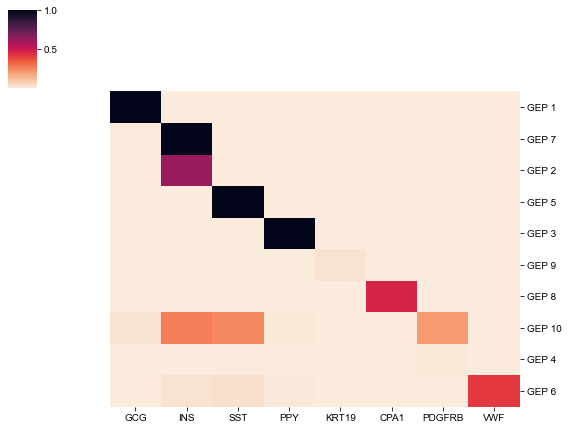

In [93]:
# Heatmap of GEP matrix for given genes
cmap = sns.color_palette("rocket_r", as_cmap=True)
sns.clustermap(gene_score_sub.transpose(), figsize=(8,6),
               row_cluster=False, col_cluster=False, cmap=cmap)

In [95]:
# Gene scores of known marker genes in each GEP
markers = {'alpha':['GCG'], 'beta': ['INS'], 'delta':['SST'], 'gamma':['PPY'],
          'ductal':['KRT19'], 'acinar':['CPA1'], 'stellate':['PDGFRB'], 'endothelial':['VWF']}
markers_gene = []
for k in markers.keys():
    markers_gene = markers_gene + markers[k]
gene_score_sub = gene_score.loc[markers_gene,:]

In [106]:
adata = sc.read_h5ad('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron.h5ad')
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.regress_out(adata, ['n_counts'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

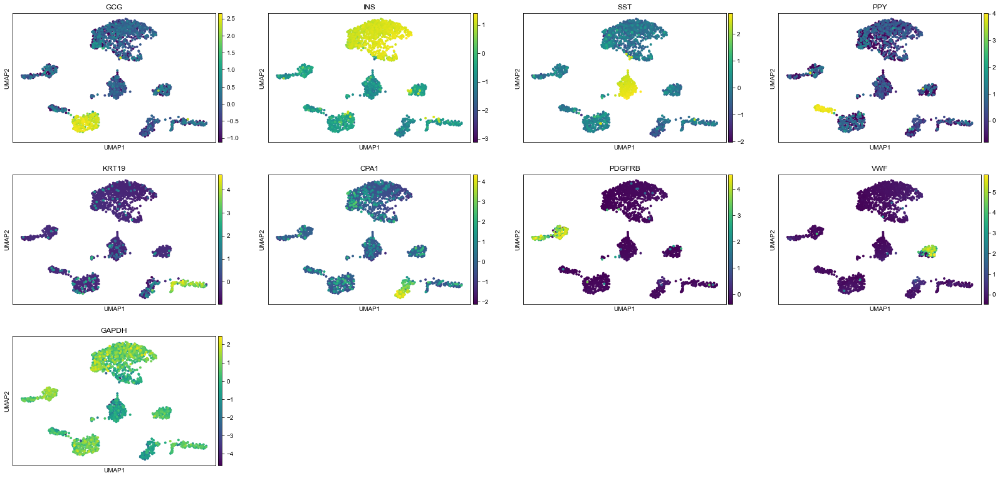

In [107]:
sc.pl.umap(adata, color=markers_gene+['GAPDH'])

/ysm-gpfs/pi/zhao/yw599/conda_envs/scvi/lib/python3.7/site-packages/scanpy/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  _ = ax.pcolor(_color_df, **kwds)


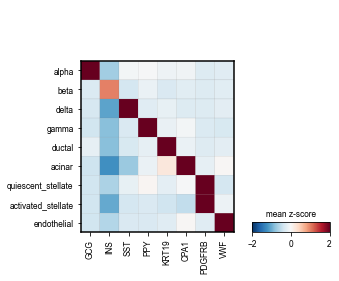

In [108]:
# scale and store results in layer
adata.layers['scaled'] = sc.pp.scale(adata, copy=True).X
categories_order = ['alpha', 'beta', 'delta', 'gamma', 'ductal', 'acinar', 'quiescent_stellate', 
                    'activated_stellate', 'endothelial']
sc.pl.matrixplot(adata[adata.obs['assigned_cluster'] != 'epsilon'], markers_gene, 'assigned_cluster', categories_order=categories_order,
                 colorbar_title='mean z-score', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r',
                 save='baron_markers.pdf')

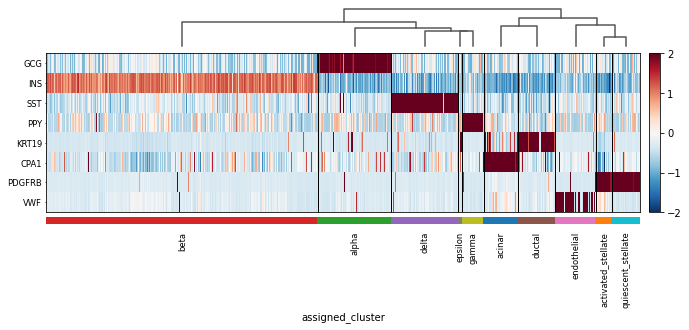

In [243]:
sc.pl.heatmap(adata, markers_gene, groupby='assigned_cluster', dendrogram=True, layer='scaled', 
              cmap='RdBu_r', vmax=2, vmin=-2, swap_axes=True, figsize=(11,4),
              var_group_rotation=20)

# Run DEG tests using inferred usage

In [ ]:
from scAAnet.tools import programDEG

In [ ]:
test_use = 'nb_naive'
offset = True
dist = 'ZINB'
rs = 8
K = 10

usage = load_df_from_npz('/home/yw599/project/baron_data/baron_beta.usage.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
count = sc.read_h5ad('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron_beta.h5ad')
resultsfn = '/home/yw599/project/baron_data/baron_beta.deg.wu20.%s.rs%d.k%s.%s.%s.pkl' % (dist, rs, K, test_use, offset)

usage = usage[count.obs.assigned_cluster=='beta'][[2,7]]
count = count[count.obs.assigned_cluster=='beta']

usage = usage.to_numpy()
count = pd.DataFrame(count.X.todense(), index=count.obs.index, columns=count.var.index)

results = programDEG(count, usage, test_use, offset, min_counts_per_cell=30)
f = open(resultsfn, 'wb')
pickle.dump(results, f)
f.close()


In [14]:
import pickle
with open('/home/yw599/project/baron_data/baron.beta.deg.wu20.%s.rs%d.k%s.nb_naive.True.pkl' % (dist, rs, K), 'rb') as f:
    deg = pickle.load(f)

In [89]:
keys = list(deg.keys())
for i in range(len(deg)):
    re = deg[keys[i]]
    print('%s:'%(keys[i]), np.sum(re['p.val.adj'] < 0.05))
    print(re.sort_values(by='p.val.adj').head(20))

gep_1: 154
          gene   coef.est          p.val    z.score      p.val.adj
613       IAPP   4.924296  7.775968e-190  29.388181  1.145400e-186
577    HERPUD1  -5.963955  3.744228e-161 -27.050734  5.515248e-158
606      HSPA5  -4.401370  1.135804e-141 -25.340773  1.673039e-138
365      DDIT3  -8.123891  2.485495e-138 -25.035917  3.661134e-135
948      PDIA4  -4.243804   6.511700e-87 -19.760530   9.591734e-84
846       MT2A  -6.007507   3.789238e-86 -19.671432   5.581548e-83
1011  PPP1R15A  -6.302190   3.952792e-85 -19.552178   5.822462e-82
1366     TRIB3  -7.987970   9.363656e-85 -19.508135   1.379267e-81
537       GHRL -11.090837   7.820084e-61 -16.454237   1.151898e-57
1168      SETX  -5.343637   2.691805e-56 -15.809125   3.965029e-53
17       ACTG1  -2.785427   1.256396e-55 -15.711761   1.850671e-52
0          GCG  -3.021456   1.282967e-51 -15.115345   1.889811e-48
249      CEBPB  -5.603322   1.810805e-51 -15.092629   2.667316e-48
1262       SST  -2.234114   6.445921e-40 -13.223203

In [235]:
# Save DEG results sorted by adjusted p values and separated by the sign of coefs to file
keys = list(deg.keys())
for i in range(len(deg)):
    re = deg[keys[i]]
    re = re.sort_values(by='p.val.adj')
    re_pos = re[re['z.score']>0]
    re_neg = re[re['z.score']<0]
    re_pos.to_excel('/home/yw599/project/baron_data/baron.beta.deg.%s.pos.wu20%s.rs%d.k%s.nb_naive.True.xlsx' 
                    % (keys[i], dist, rs, K))
    re_neg.to_excel('/home/yw599/project/baron_data/baron.beta.deg.%s.neg.wu20%s.rs%d.k%s.nb_naive.True.xlsx' 
                    % (keys[i], dist, rs, K))

In [28]:
gep_num = 2
gene_num = 20
re = deg['gep_1']
re = re.sort_values(by='z.score', ascending=False)
re_pos_1 = re[re['z.score']>0]
re_neg_1 = re[re['z.score']<0]
gene_list = list(re_pos_1.gene[:gene_num]) + list(re_neg_1.gene[:-(gene_num+1):-1])
gene_list = list(re_pos_1.gene[:gene_num])

In [24]:
gep_num = 7
gene_num = 20
re = deg['gep_2']
re = re.sort_values(by='z.score', ascending=False)
re_pos_2 = re[re['z.score']>0]
re_neg_2 = re[re['z.score']<0]
gene_list = list(re_pos_2.gene[:gene_num]) + list(re_neg_2.gene[:-(gene_num+1):-1])
gene_list = list(re_pos_2.gene[:gene_num])

In [133]:
# gep_num = 7
# gene_list = ['INS','SST', 'GCG', 'PPY']

In [ ]:
adata = sc.read_h5ad('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron.h5ad')
for i in range(usage.shape[1]):
    adata.obs["GEP %s"%(i+1)] = usage.iloc[:,i]
adata.obsm["X_scaanet"] = usage

adata_beta = adata[adata.obs.assigned_cluster=='beta', :]
sc.pp.normalize_total(adata_beta, target_sum=1e4)
sc.pp.log1p(adata_beta)
adata_beta.raw = adata_beta
sc.pp.scale(adata_beta, max_value=10)
sc.tl.pca(adata_beta, svd_solver='arpack')

In [29]:
exp_beta = pd.DataFrame(adata_beta.raw.X.todense(), index=adata_beta.obs.index, columns=adata_beta.var.index)
exp_beta = exp_beta[gene_list]
exp_beta = exp_beta.sub(exp_beta.min(axis=0), axis='columns').div(exp_beta.max(axis=0)-exp_beta.min(axis=0), axis='columns')
exp_beta['GEP %d usage'%gep_num] = adata_beta.obs['GEP %d'%gep_num].values
cell_sorted = exp_beta.sort_values(by='GEP %d usage'%gep_num).index
exp_beta = exp_beta.loc[cell_sorted,:]

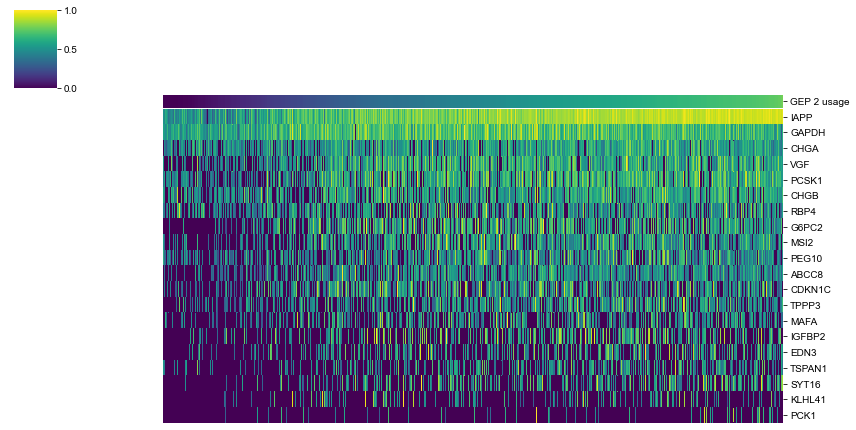

In [17]:
# GEP 2
cmap = sns.color_palette("viridis", as_cmap=True)
col_colors = exp_beta.iloc[:,20].map(cmap)

# Order gene by the area under curve (y: expression, x: cell usage)
auc = np.array([np.trapz(y=exp_beta[g].values, x=exp_beta['GEP 2 usage'].values) for g in gene_list])
order = auc.argsort()[::-1]

sns.clustermap(exp_beta.iloc[:,:20].transpose().iloc[order,:], xticklabels=False, figsize=(12,6),
               row_cluster=False, col_cluster=False, col_colors=col_colors, cmap=cmap)

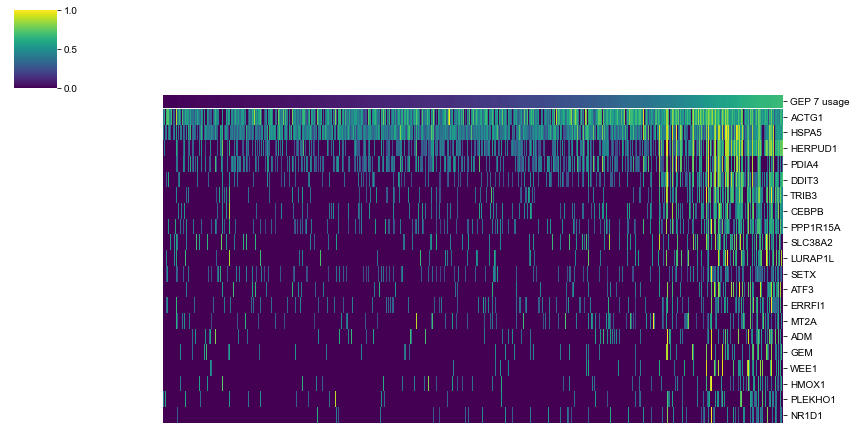

In [134]:
# GEP 7
cmap = sns.color_palette("viridis", as_cmap=True)
col_colors = exp_beta.iloc[:,20].map(cmap)

# Order gene by the area under curve (y: expression, x: cell usage)
auc = np.array([np.trapz(y=exp_beta[g].values, x=exp_beta['GEP 7 usage'].values) for g in gene_list])
order = auc.argsort()[::-1]

sns.clustermap(exp_beta.iloc[:,:20].transpose().iloc[order,:], xticklabels=False, figsize=(12,6),
               row_cluster=False, col_cluster=False, col_colors=col_colors, cmap=cmap)
# plt.savefig('/ysm-gpfs/pi/zhao/yw599/scAAnet/figures/baron/gep7_gene_heatmap.pdf')
# plt.close()

## Enrichment analysis

In [11]:
import gseapy as gp

In [12]:
adata = sc.read_h5ad('/gpfs/loomis/pi/zhao2/yw599/jupyter/baron_data/baron.h5ad')

In [17]:
keys = list(deg.keys())
re_2 = deg[keys[0]]
re_2 = re_2.sort_values(by='z.score', ascending=False)
re_7 = deg[keys[1]]
re_7 = re_7.sort_values(by='z.score', ascending=False)

In [56]:
# Only perform DE test for highly variable genes

# Background genes
bg_gene = adata.var.index.tolist()

# Ordered gene list
glist = re_2.gene.tolist()

# Number of significantly positive genes
n_gene = np.sum((re_2['z.score']>0) & (re_2['p.val.adj']<0.05))

# Enrichr using GO BP
enr_2 = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c5.go.bp.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background=bg_gene,
                   description='test_name',
                   outdir='gseapy/baron/gep_2/enrichr_go_bp',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

# Enrichr using REACTOME
enr_2_ = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c2.cp.reactome.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background=bg_gene,
                   description='test_name',
                   outdir='gseapy/baron/gep_2/enrichr_reactome',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

2021-06-25 10:40:58,835 User Defined gene sets is given: ../MSigDB/c5.go.bp.v7.4.symbols.gmt
2021-06-25 10:40:59,016 Connecting to Enrichr Server to get latest library names
2021-06-25 10:40:59,421 Save file of enrichment results: Job Id:46986054103760
2021-06-25 10:40:59,433 Done.

2021-06-25 10:40:59,455 User Defined gene sets is given: ../MSigDB/c2.cp.reactome.v7.4.symbols.gmt
2021-06-25 10:40:59,477 Connecting to Enrichr Server to get latest library names
2021-06-25 10:40:59,530 Save file of enrichment results: Job Id:46986052049440
2021-06-25 10:40:59,537 Done.



In [57]:
enr_2.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
379,CUSTOM46986054103760,GOBP_PEPTIDE_HORMONE_SECRETION,7/56,0.000004,0.003155,RBP4;MAFA;G6PC2;EDN3;VGF;ABCC8;CHGA
207,CUSTOM46986054103760,GOBP_INSULIN_SECRETION,6/45,0.000015,0.003973,RBP4;MAFA;G6PC2;VGF;ABCC8;CHGA
257,CUSTOM46986054103760,GOBP_MONOSACCHARIDE_BIOSYNTHETIC_PROCESS,4/12,0.000010,0.003973,RBP4;G6PC2;GAPDH;PCK1
175,CUSTOM46986054103760,GOBP_GLUCOSE_METABOLIC_PROCESS,5/30,0.000028,0.004461,RBP4;G6PC2;PCK1;IGF2;GAPDH
194,CUSTOM46986054103760,GOBP_HORMONE_TRANSPORT,7/73,0.000024,0.004461,RBP4;MAFA;G6PC2;EDN3;VGF;ABCC8;CHGA
381,CUSTOM46986054103760,GOBP_PEPTIDE_SECRETION,7/80,0.000045,0.005031,RBP4;MAFA;G6PC2;EDN3;VGF;ABCC8;CHGA
36,CUSTOM46986054103760,GOBP_CARBOHYDRATE_BIOSYNTHETIC_PROCESS,5/32,0.000039,0.005031,RBP4;G6PC2;PCK1;IGF2;GAPDH
748,CUSTOM46986054103760,GOBP_SIGNAL_RELEASE,7/87,0.000077,0.006857,RBP4;MAFA;G6PC2;EDN3;VGF;ABCC8;CHGA
575,CUSTOM46986054103760,GOBP_REGULATION_OF_HORMONE_LEVELS,8/119,0.000078,0.006857,RBP4;MAFA;G6PC2;EDN3;VGF;ABCC8;PCSK1;CHGA
259,CUSTOM46986054103760,GOBP_MONOSACCHARIDE_METABOLIC_PROCESS,5/39,0.000105,0.008322,RBP4;G6PC2;PCK1;IGF2;GAPDH


In [58]:
enr_2_.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
22,CUSTOM46986052049440,REACTOME_GLUCONEOGENESIS,3/4,0.000008,0.000587,G6PC2;GAPDH;PCK1
23,CUSTOM46986052049440,REACTOME_GLUCOSE_METABOLISM,3/7,0.000066,0.002501,G6PC2;GAPDH;PCK1
53,CUSTOM46986052049440,REACTOME_REGULATION_OF_GENE_EXPRESSION_IN_BETA...,2/3,0.000483,0.012233,MAFA;IAPP
54,CUSTOM46986052049440,REACTOME_REGULATION_OF_INSULIN_LIKE_GROWTH_FAC...,4/45,0.002322,0.044115,IGFBP2;CHGB;VGF;IGF2
52,CUSTOM46986052049440,REACTOME_REGULATION_OF_BETA_CELL_DEVELOPMENT,2/7,0.003273,0.049756,MAFA;IAPP
0,CUSTOM46986052049440,REACTOME_ABACAVIR_METABOLISM,1/1,0.012987,0.109668,PCK1
72,CUSTOM46986052049440,REACTOME_SYNTHESIS_SECRETION_AND_INACTIVATION_...,1/1,0.012987,0.109668,PCSK1
44,CUSTOM46986052049440,REACTOME_NR1H2_NR1H3_REGULATE_GENE_EXPRESSION_...,1/1,0.012987,0.109668,PCK1
40,CUSTOM46986052049440,REACTOME_NEDDYLATION,2/12,0.009885,0.109668,ASB9;KLHL41
7,CUSTOM46986052049440,REACTOME_ANTIGEN_PROCESSING_UBIQUITINATION_PRO...,2/15,0.015354,0.116690,ASB9;KLHL41


In [64]:
# Only perform DE test for highly variable genes

# Background genes
bg_gene = adata.var.index.tolist()

# Ordered gene list
glist = re_7.gene.tolist()

# Number of significantly positive genes
n_gene = np.sum((re_7['z.score']>0) & (re_7['p.val.adj']<0.05))

# Enrichr using GO BP
enr_7 = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c5.go.bp.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background=bg_gene,
                   description='test_name',
                   outdir='gseapy/baron/gep_7/enrichr_go_bp',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

# Enrichr using REACTOME
enr_7_ = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c2.cp.reactome.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background=bg_gene,
                   description='test_name',
                   outdir='gseapy/baron/gep_7/enrichr_reactome',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

2021-06-25 10:48:50,473 User Defined gene sets is given: ../MSigDB/c5.go.bp.v7.4.symbols.gmt
2021-06-25 10:48:50,590 Connecting to Enrichr Server to get latest library names
2021-06-25 10:48:51,413 Save file of enrichment results: Job Id:46986687373600
2021-06-25 10:48:51,435 Done.

2021-06-25 10:48:51,456 User Defined gene sets is given: ../MSigDB/c2.cp.reactome.v7.4.symbols.gmt
2021-06-25 10:48:51,477 Connecting to Enrichr Server to get latest library names
2021-06-25 10:48:51,605 Save file of enrichment results: Job Id:46986001113592
2021-06-25 10:48:51,615 Done.



In [65]:
enr_7.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
1869,CUSTOM46986687373600,GOBP_RESPONSE_TO_ENDOPLASMIC_RETICULUM_STRESS,12/32,1.542080e-09,0.000003,HERPUD1;CEBPB;CXCL8;WIPI1;CTH;HSPA1A;TRIB3;ATF...
198,CUSTOM46986687373600,GOBP_CELLULAR_RESPONSE_TO_TOPOLOGICALLY_INCORR...,9/17,4.857917e-09,0.000004,HERPUD1;CTH;CXCL8;WIPI1;HSPA1A;ATF3;DDIT3;HSPA...
2021,CUSTOM46986687373600,GOBP_STRESS_RESPONSE_TO_METAL_ION,7/9,6.015107e-09,0.000004,MT2A;MT1F;MT1G;MT1M;HSPA5;MT1E;MT1X
348,CUSTOM46986687373600,GOBP_ENDOPLASMIC_RETICULUM_UNFOLDED_PROTEIN_RE...,8/14,1.686823e-08,0.000009,HERPUD1;CTH;CXCL8;WIPI1;ATF3;DDIT3;HSPA5;PPP1R15A
201,CUSTOM46986687373600,GOBP_CELLULAR_RESPONSE_TO_ZINC_ION,6/8,1.197887e-07,0.000032,MT2A;MT1F;MT1G;MT1M;MT1E;MT1X
300,CUSTOM46986687373600,GOBP_DETOXIFICATION_OF_INORGANIC_COMPOUND,6/8,1.197887e-07,0.000032,MT2A;MT1F;MT1G;MT1M;MT1E;MT1X
500,CUSTOM46986687373600,GOBP_INTEGRATED_STRESS_RESPONSE_SIGNALING,6/8,1.197887e-07,0.000032,HERPUD1;CXCL8;ATF3;DDIT3;HSPA5;PPP1R15A
1928,CUSTOM46986687373600,GOBP_RESPONSE_TO_TOPOLOGICALLY_INCORRECT_PROTEIN,9/22,8.365682e-08,0.000032,HERPUD1;CXCL8;WIPI1;CTH;HSPA1A;ATF3;DDIT3;HSPA...
520,CUSTOM46986687373600,GOBP_INTRINSIC_APOPTOTIC_SIGNALING_PATHWAY_IN_...,6/9,3.473359e-07,0.000073,HERPUD1;CEBPB;TRIB3;HSPA1A;DDIT3;PPP1R15A
374,CUSTOM46986687373600,GOBP_ER_NUCLEUS_SIGNALING_PATHWAY,6/9,3.473359e-07,0.000073,HERPUD1;CXCL8;ATF3;DDIT3;HSPA5;PPP1R15A


In [66]:
enr_7_.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
31,CUSTOM46986001113592,REACTOME_CELLULAR_RESPONSES_TO_EXTERNAL_STIMULI,17/62,1.240885e-10,3.859153e-08,MT2A;CEBPB;MT1F;NR1D1;MT1G;CXCL8;ATF5;HSPA1A;T...
196,CUSTOM46986001113592,REACTOME_PERK_REGULATES_GENE_EXPRESSION,6/7,3.098473e-08,2.409063e-06,HERPUD1;CEBPB;CXCL8;ATF3;DDIT3;HSPA5
223,CUSTOM46986001113592,REACTOME_RESPONSE_OF_EIF2AK1_HRI_TO_HEME_DEFIC...,6/7,3.098473e-08,2.409063e-06,CEBPB;ATF5;TRIB3;ATF3;DDIT3;PPP1R15A
305,CUSTOM46986001113592,REACTOME_UNFOLDED_PROTEIN_RESPONSE_UPR,7/10,1.937337e-08,2.409063e-06,HERPUD1;CEBPB;CXCL8;WIPI1;ATF3;DDIT3;HSPA5
162,CUSTOM46986001113592,REACTOME_METALLOTHIONEINS_BIND_METALS,6/8,1.197887e-07,6.209048e-06,MT2A;MT1F;MT1G;MT1M;MT1E;MT1X
226,CUSTOM46986001113592,REACTOME_RESPONSE_TO_METAL_IONS,6/8,1.197887e-07,6.209048e-06,MT2A;MT1F;MT1G;MT1M;MT1E;MT1X
13,CUSTOM46986001113592,REACTOME_ATF4_ACTIVATES_GENES_IN_RESPONSE_TO_E...,5/6,6.717223e-07,2.984366e-05,HERPUD1;CEBPB;CXCL8;ATF3;DDIT3
224,CUSTOM46986001113592,REACTOME_RESPONSE_OF_EIF2AK4_GCN2_TO_AMINO_ACI...,4/4,2.891361e-06,1.124017e-04,DDIT3;TRIB3;ATF3;CEBPB
34,CUSTOM46986001113592,REACTOME_CELLULAR_RESPONSE_TO_STARVATION,4/5,1.399372e-05,4.835609e-04,DDIT3;CEBPB;TRIB3;ATF3
93,CUSTOM46986001113592,REACTOME_FOXO_MEDIATED_TRANSCRIPTION,5/17,4.797449e-04,1.492007e-02,CCNG2;FBXO32;GADD45A;DDIT3;INS


In [12]:
from os import listdir
from some_functions import dotplot

In [15]:
gep = 7
gmt = '../MSigDB/c2.cp.reactome.v7.4.symbols.gmt' 
resfolder = 'gseapy/baron/gep_%d/enrichr_reactome/'%gep
resfile = [file for file in listdir(resfolder) if file.endswith('.txt')][0]
respath = resfolder+resfile
db = 'REACTOME'
savefile = respath[:-3] + 'xlsx'
saveplot = 'figures/baron/gep_%d.reactome.pdf'%gep
dotplot(pd.read_csv(respath, sep='\t'), db, gmt, go=False, savefile=savefile, saveplot=saveplot)

/gpfs/ysm/home/yw599/venv/lib64/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/gpfs/loomis/pi/zhao2/yw599/scAAnet/scAAnet_latest/some_functions.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Term'].iloc[i] = convertTermREACTOME(df['Term'].iloc[i], gmt)


In [14]:
gep = 7
gmt = '../MSigDB/c5.go.bp.v7.4.symbols.gmt' 
resfolder = 'gseapy/baron/gep_%d/enrichr_go_bp/'%gep
resfile = [file for file in listdir(resfolder) if file.endswith('.txt')][0]
respath = resfolder+resfile
db = 'GO biological process'
#savefile = respath[:-3] + 'xlsx'
savefile=False
saveplot = 'figures/baron/gep_%d.go.bp.pdf'%gep
dotplot(pd.read_csv(respath, sep='\t'), db, gmt, savefile=savefile, saveplot=saveplot)

/gpfs/ysm/home/yw599/venv/lib64/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/gpfs/loomis/pi/zhao2/yw599/scAAnet/scAAnet_latest/some_functions.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Term'].iloc[i] = convertTermGO(df['Term'].iloc[i], gmt)


In [19]:
from matplotlib.colors import Normalize
from some_functions import unique, convertTermREACTOME
cmap='viridis'

In [24]:
gep = 2
gmt = '../MSigDB/c2.cp.reactome.v7.4.symbols.gmt' 
resfolder = 'gseapy/baron/gep_%d/enrichr_reactome/'%gep
resfile = [file for file in listdir(resfolder) if file.endswith('.txt')][0]
respath = resfolder+resfile
title = 'REACTOME'
saveplot = 'figures/baron/gep_%d.reactome.pdf'%gep
res = pd.read_csv(respath, sep='\t')

In [164]:
gep = 7
gmt = '../MSigDB/c5.go.bp.v7.4.symbols.gmt' 
resfolder = 'gseapy/baron_all/gep_%d/enrichr_go_bp/'%gep
resfile = [file for file in listdir(resfolder) if file.endswith('.txt')][0]
respath = resfolder+resfile
db = 'GO biological process'
savefile = respath[:-3] + 'xlsx'
saveplot = 'figures/baron/all_gene.gep_%d.go.bp.pdf'%gep
dotplot(pd.read_csv(respath, sep='\t'), db, gmt, savefile=savefile, saveplot=saveplot)

/ysm-gpfs/pi/zhao/yw599/conda_envs/scvi/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/ysm-gpfs/pi/zhao/yw599/conda_envs/scvi/lib/python3.7/site-packages/pandas/core/indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
